In [134]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

# Импортируем библиотеку pandas.
import pandas as pd
# Импортируем библиотеку numpy.
import numpy as np
# Импортируем функцию Counter.
from collections import Counter

# Загружаем специальный инструмент для разбивки.
from sklearn.model_selection import train_test_split  

# Импортируем инструмент для оценки значимости непрерывных переменных.
from sklearn.feature_selection import f_classif

# Импортируем инструмент для создания и обучения модели.
from sklearn.ensemble import RandomForestRegressor 
# Импортируем инструменты для оценки точности модели.
from sklearn import metrics 
# Импортируем библиотеки для вызуализации.
import matplotlib.pyplot as plt
import seaborn as sns 
import plotly.express as px
import matplotlib
import pycountry as pc
import category_encoders as ce

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/sf-booking/hotels_test.csv
/kaggle/input/sf-booking/hotels_train.csv
/kaggle/input/sf-booking/submission.csv


# Project-3: Предсказание рейтинга отелей на основе данных Booking

## Цель проекта
* Разработка модели предсказания рейтинга отелей

### Задачи проекта:

* Удаление строковых значений
* Очистка пропущенных значений
* Моделирование признаков
    + проектирование признаков 
    + кодирование признаков
* Отбор признаков
* Создание модели 

In [135]:
# фиксируем RANDOM_SEED
RANDOM_SEED = 42

In [136]:
# зафиксируем версию пакетов, чтобы эксперименты были воспроизводимы:
!pip freeze > requirements.txt

In [137]:
# Подгрузим наши данные из соревнования
DATA_DIR = '/kaggle/input/sf-booking/'
df_train = pd.read_csv(DATA_DIR+'/hotels_train.csv') # датасет для обучения
df_test = pd.read_csv(DATA_DIR+'hotels_test.csv') # датасет для предсказания
sample_submission = pd.read_csv(DATA_DIR+'/submission.csv') 

In [138]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 386803 entries, 0 to 386802
Data columns (total 17 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   hotel_address                               386803 non-null  object 
 1   additional_number_of_scoring                386803 non-null  int64  
 2   review_date                                 386803 non-null  object 
 3   average_score                               386803 non-null  float64
 4   hotel_name                                  386803 non-null  object 
 5   reviewer_nationality                        386803 non-null  object 
 6   negative_review                             386803 non-null  object 
 7   review_total_negative_word_counts           386803 non-null  int64  
 8   total_number_of_reviews                     386803 non-null  int64  
 9   positive_review                             386803 non-null  object 
 

In [139]:
df_train.head(2)

,hotel_address,additional_number_of_scoring,review_date,average_score,hotel_name,reviewer_nationality,negative_review,review_total_negative_word_counts,total_number_of_reviews,positive_review,review_total_positive_word_counts,total_number_of_reviews_reviewer_has_given,reviewer_score,tags,days_since_review,lat,lng
0,Stratton Street Mayfair Westminster Borough Lo...,581,2/19/2016,8.4,The May Fair Hotel,United Kingdom,Leaving,3,1994,Staff were amazing,4,7,10.0,"[' Leisure trip ', ' Couple ', ' Studio Suite ...",531 day,51.507894,-0.143671
1,130 134 Southampton Row Camden London WC1B 5AF...,299,1/12/2017,8.3,Mercure London Bloomsbury Hotel,United Kingdom,poor breakfast,3,1361,location,2,14,6.3,"[' Business trip ', ' Couple ', ' Standard Dou...",203 day,51.521009,-0.123097


In [140]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 128935 entries, 0 to 128934
Data columns (total 16 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   hotel_address                               128935 non-null  object 
 1   additional_number_of_scoring                128935 non-null  int64  
 2   review_date                                 128935 non-null  object 
 3   average_score                               128935 non-null  float64
 4   hotel_name                                  128935 non-null  object 
 5   reviewer_nationality                        128935 non-null  object 
 6   negative_review                             128935 non-null  object 
 7   review_total_negative_word_counts           128935 non-null  int64  
 8   total_number_of_reviews                     128935 non-null  int64  
 9   positive_review                             128935 non-null  object 
 

In [141]:
df_test.head(2)

,hotel_address,additional_number_of_scoring,review_date,average_score,hotel_name,reviewer_nationality,negative_review,review_total_negative_word_counts,total_number_of_reviews,positive_review,review_total_positive_word_counts,total_number_of_reviews_reviewer_has_given,tags,days_since_review,lat,lng
0,Via Senigallia 6 20161 Milan Italy,904,7/21/2017,8.1,Hotel Da Vinci,United Kingdom,Would have appreciated a shop in the hotel th...,52,16670,Hotel was great clean friendly staff free bre...,62,1,"[' Leisure trip ', ' Couple ', ' Double Room '...",13 days,45.533137,9.171102
1,Arlandaweg 10 Westpoort 1043 EW Amsterdam Neth...,612,12/12/2016,8.6,Urban Lodge Hotel,Belgium,No tissue paper box was present at the room,10,5018,No Positive,0,7,"[' Leisure trip ', ' Group ', ' Triple Room ',...",234 day,52.385649,4.834443


In [142]:
df_train['sample'] = 1 # помечаем где у нас трейн
df_test['sample'] = 0 # помечаем где у нас тест
df_test['reviewer_score'] = 0 # в тесте у нас нет значения reviewer_score, мы его должны предсказать, по этому пока просто заполняем нулями

hotels = df_test.append(df_train, sort=False).reset_index(drop=True) # объединяем

In [143]:
hotels.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 515738 entries, 0 to 515737
Data columns (total 18 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   hotel_address                               515738 non-null  object 
 1   additional_number_of_scoring                515738 non-null  int64  
 2   review_date                                 515738 non-null  object 
 3   average_score                               515738 non-null  float64
 4   hotel_name                                  515738 non-null  object 
 5   reviewer_nationality                        515738 non-null  object 
 6   negative_review                             515738 non-null  object 
 7   review_total_negative_word_counts           515738 non-null  int64  
 8   total_number_of_reviews                     515738 non-null  int64  
 9   positive_review                             515738 non-null  object 
 

Первоначальная версия датасета содержит 17 полей со следующей информацией:

hotel_address — адрес отеля;
review_date — дата, когда рецензент разместил соответствующий отзыв;
average_score — средний балл отеля, рассчитанный на основе последнего комментария за последний год;
hotel_name — название отеля;
reviewer_nationality — страна рецензента;
negative_review — отрицательный отзыв, который рецензент дал отелю;
review_total_negative_word_counts — общее количество слов в отрицательном отзыв;
positive_review — положительный отзыв, который рецензент дал отелю;
review_total_positive_word_counts — общее количество слов в положительном отзыве.
reviewer_score — оценка, которую рецензент поставил отелю на основе своего опыта;
total_number_of_reviews_reviewer_has_given — количество отзывов, которые рецензенты дали в прошлом;
total_number_of_reviews — общее количество действительных отзывов об отеле;
tags — теги, которые рецензент дал отелю;
days_since_review — количество дней между датой проверки и датой очистки;
additional_number_of_scoring — есть также некоторые гости, которые просто поставили оценку сервису, но не оставили отзыв. Это число указывает, сколько там действительных оценок без проверки.
lat — географическая широта отеля;
lng — географическая долгота отеля.

In [144]:
# Посмотрим сколько отелей представленно в данных.
hotels_with_passes = hotels[['hotel_address', 'lat', 'lng']].drop_duplicates()
# Выведем информацию.
display(hotels_with_passes.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1493 entries, 0 to 117586
Data columns (total 3 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   hotel_address  1493 non-null   object 
 1   lat            1476 non-null   float64
 2   lng            1476 non-null   float64
dtypes: float64(2), object(1)
memory usage: 46.7+ KB


None

## Очистка данных от пропусков

In [145]:
# Посмотрим адреса отелей с пропусками координат.
display(hotels_with_passes[hotels_with_passes['lat'].isnull() == True])

,hotel_address,lat,lng
35,W hringer Stra e 33 35 09 Alsergrund 1090 Vien...,NaN,NaN
476,Gr nentorgasse 30 09 Alsergrund 1090 Vienna Au...,NaN,NaN
526,23 Rue Damr mont 18th arr 75018 Paris France,NaN,NaN
569,Josefst dter Stra e 10 12 08 Josefstadt 1080 V...,NaN,NaN
609,Taborstra e 8 A 02 Leopoldstadt 1020 Vienna Au...,NaN,NaN
774,Josefst dter Stra e 22 08 Josefstadt 1080 Vien...,NaN,NaN
1285,Bail n 4 6 Eixample 08010 Barcelona Spain,NaN,NaN
2389,Landstra er G rtel 5 03 Landstra e 1030 Vienna...,NaN,NaN
2802,4 rue de la P pini re 8th arr 75008 Paris France,NaN,NaN
3495,20 Rue De La Ga t 14th arr 75014 Paris France,NaN,NaN


In [146]:
# С помощью Google Maps найдём координаты этих отелей и составим соответствующий датафрейм.
hotels_coordinates = pd.DataFrame({'hotel_address':[
    'Josefst dter Stra e 10 12 08 Josefstadt 1080 Vienna Austria',
    'Taborstra e 8 A 02 Leopoldstadt 1020 Vienna Austria',
    'W hringer Stra e 33 35 09 Alsergrund 1090 Vienna Austria',
    '4 rue de la P pini re 8th arr 75008 Paris France',
    'Landstra er G rtel 5 03 Landstra e 1030 Vienna Austria',
    'W hringer Stra e 12 09 Alsergrund 1090 Vienna Austria',
    'Savoyenstra e 2 16 Ottakring 1160 Vienna Austria',
    'Sieveringer Stra e 4 19 D bling 1190 Vienna Austria',
    'Bail n 4 6 Eixample 08010 Barcelona Spain',
    'Gr nentorgasse 30 09 Alsergrund 1090 Vienna Austria',
    'Hasenauerstra e 12 19 D bling 1190 Vienna Austria',
    'Josefst dter Stra e 22 08 Josefstadt 1080 Vienna Austria',
    '23 Rue Damr mont 18th arr 75018 Paris France',
    'Paragonstra e 1 11 Simmering 1110 Vienna Austria',
    '20 Rue De La Ga t 14th arr 75014 Paris France',
    'Pau Clar s 122 Eixample 08009 Barcelona Spain',
    'Sep lveda 180 Eixample 08011 Barcelona Spain'], 'lat':[
    
    48.209910,
    48.21360,
    48.22036,
    48.87532,
    48.18888,
    48.21700,
    48.21975,
    48.24614,
    41.39181,
    48.22163,
    48.20971,
    48.20973,
    48.88910,
    48.18814,
    48.84012,
    41.39272,
    41.38340], 'lng':[
    
    16.353425,
    16.37988,
    16.35580,
    2.32338,
    16.38377,
    16.35989,
    16.28565,
    16.34153,
    2.17784,
    16.36641,
    16.35145,
    16.35148,
    2.33310,
    16.42049,
    2.32357,
    2.16739,
    2.16294]
})

In [147]:
# Заполним пропуски координатами в соодветствии с адресом путем объединения датафреймов.
hotels_with_passes = (hotels_with_passes.merge(hotels_coordinates,on='hotel_address',how='left',
                          suffixes=('','\x00')).sort_index(axis=1).bfill(axis=1)[hotels_with_passes.columns])

In [148]:
# Добавим в первоначальный датафрейм наши данные.
hotels = hotels.merge(hotels_with_passes, how='left', on='hotel_address')
# Удалим ненужные столбцы.
hotels = hotels.drop(['lat_x', 'lng_x'], axis=1)
# Преобразуем координаты в тип float.
hotels['lat_y'] = hotels['lat_y'].astype(float)
hotels['lng_y'] = hotels['lng_y'].astype(float)
# Выведем информацию.
display(hotels.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 515738 entries, 0 to 515737
Data columns (total 18 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   hotel_address                               515738 non-null  object 
 1   additional_number_of_scoring                515738 non-null  int64  
 2   review_date                                 515738 non-null  object 
 3   average_score                               515738 non-null  float64
 4   hotel_name                                  515738 non-null  object 
 5   reviewer_nationality                        515738 non-null  object 
 6   negative_review                             515738 non-null  object 
 7   review_total_negative_word_counts           515738 non-null  int64  
 8   total_number_of_reviews                     515738 non-null  int64  
 9   positive_review                             515738 non-null  object 
 

None

In [149]:
hotels.nunique(dropna=False) #посмотрим сколько уникальных значений у каждого признака

hotel_address                                   1493
additional_number_of_scoring                     480
review_date                                      731
average_score                                     34
hotel_name                                      1492
reviewer_nationality                             227
negative_review                               330011
review_total_negative_word_counts                402
total_number_of_reviews                         1142
positive_review                               412601
review_total_positive_word_counts                365
total_number_of_reviews_reviewer_has_given       198
tags                                           55242
days_since_review                                731
sample                                             2
reviewer_score                                    38
lat_y                                           1489
lng_y                                           1489
dtype: int64

<AxesSubplot:>

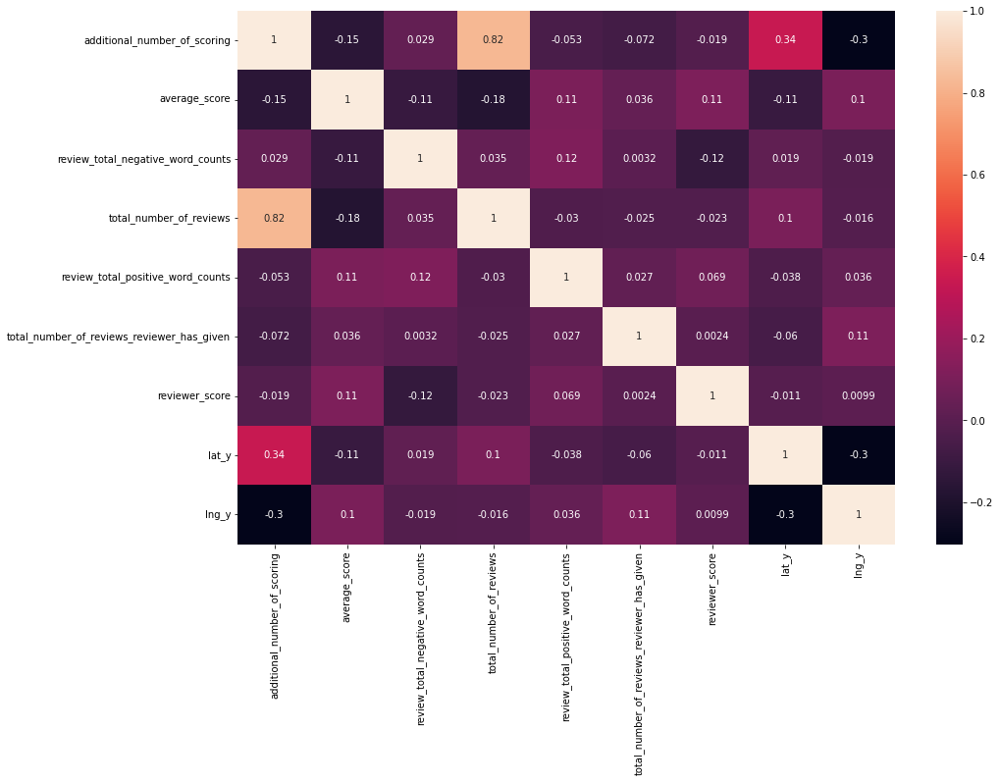

In [150]:
plt.rcParams['figure.figsize'] = (15,10) #посмотрим как соотносятся между собой числовые признаки
sns.heatmap(hotels.drop(['sample'], axis=1).corr(), annot=True)

Мы видим что признаки 'total_number_of_reviews' и 'additional_number_of_scoring' сильно коррелируют друг с другом. То есть один из них мжет быть удален, но мы пока не будем этого делать.

## Моделирование и кодирование признаков

In [151]:
#Сколько уникальных тегов представлено в наборе данных?
#находим с помощью регулярного выражения отрезки строки внутри одиночных кавычек и записываем их в список
hotels['tag_list'] = hotels['tags'].str.findall("'[^\'](.+?)[^\']'")
#формируем список уникальных тегов
tags_unique = []
for i in hotels['tag_list']:
    for tag in i:
        if tag not in tags_unique:
            tags_unique.append(tag)
print(len(tags_unique)) 

2428


In [152]:
#с помощью регулярного выражения найдем все цифры в тегах, разделенные пробелами - так обозначется
# количество ночей в фразе 'Stayed x days' и создадим новый признак 'nights'
regex = 'Stayed (\d+)'
hotels['nights'] = hotels['tags'].str.findall(regex).str.get(0)
hotels['nights'].isnull().mean() #проверяем, есть ли пропуски в значениях нового признака

0.0003722820501882739

In [153]:
#так как в новом признаке есть небольшое количество пропусков, то заменяем их на самое частое значение
hotels = hotels.fillna({'nights': hotels['nights'].mode()[0]})
#проверяем количество пропусков после заполнения
hotels['nights'].isnull().mean()

0.0

In [154]:
hotels['nights'] = hotels['nights'].astype(int) #переводим значения признака из строки в integer

In [155]:
hotels.head(3)

,hotel_address,additional_number_of_scoring,review_date,average_score,hotel_name,reviewer_nationality,negative_review,review_total_negative_word_counts,total_number_of_reviews,positive_review,review_total_positive_word_counts,total_number_of_reviews_reviewer_has_given,tags,days_since_review,sample,reviewer_score,lat_y,lng_y,tag_list,nights
0,Via Senigallia 6 20161 Milan Italy,904,7/21/2017,8.1,Hotel Da Vinci,United Kingdom,Would have appreciated a shop in the hotel th...,52,16670,Hotel was great clean friendly staff free bre...,62,1,"[' Leisure trip ', ' Couple ', ' Double Room '...",13 days,0,0.0,45.533137,9.171102,"[Leisure trip, Couple, Double Room, Stayed 2 n...",2
1,Arlandaweg 10 Westpoort 1043 EW Amsterdam Neth...,612,12/12/2016,8.6,Urban Lodge Hotel,Belgium,No tissue paper box was present at the room,10,5018,No Positive,0,7,"[' Leisure trip ', ' Group ', ' Triple Room ',...",234 day,0,0.0,52.385649,4.834443,"[Leisure trip, Group, Triple Room, Stayed 1 ni...",1
2,Mallorca 251 Eixample 08008 Barcelona Spain,46,11/26/2015,8.3,Alexandra Barcelona A DoubleTree by Hilton,Sweden,Pillows,3,351,Nice welcoming and service,5,15,"[' Business trip ', ' Solo traveler ', ' Twin ...",616 day,0,0.0,41.393192,2.161520,"[Business trip, Solo traveler, Twin Room, Stay...",1


In [156]:
#Создадим копию датасета, чтобы подробнее разобраться с тегами и вытянуть из них больше информации
n_hotels = hotels.copy()
n_hotels = n_hotels.explode('tag_list') #отдельная строка для каждого тега
len(n_hotels['tag_list'].unique()) #считаем количество уникальных тегов

2428

In [157]:
#посмотрим какая информация в большинстве своем содержится в тегах
n_hotels['tag_list'].value_counts().nlargest(35)

Leisure trip                      417778
Submitted from a mobile device    307640
Couple                            252294
Stayed 1 night                    193645
Stayed 2 nights                   133937
Solo traveler                     108545
Stayed 3 nights                    95821
Business trip                      82939
Group                              65392
Family with young children         61015
Stayed 4 nights                    47817
Double Room                        35207
Standard Double Room               32248
Superior Double Room               31393
Family with older children         26349
Deluxe Double Room                 24823
Double or Twin Room                22393
Stayed 5 nights                    20845
Standard Double or Twin Room       17483
Classic Double Room                16989
Superior Double or Twin Room       13570
2 rooms                            12393
Stayed 6 nights                     9776
Standard Twin Room                  9745
Single Room     

Из тегов мы сделали дополнительный числовой категориальный признак - количество ночей, которые рецензент провел в отеле - это информация может оказаться значимой. 
На первом месте по популярности мы видим тег Leisure trip, а на восьмом месте его антоним Business trip. Так как в сумме по количеству они дают основную часть отзывов, то мы можем создать еще один, бинарный признак, где 0 - это рецензии людей, которые останавливались в отеле на отдых, а 1 - тех, кто был в отеле во время деловой поездки. 

In [158]:
hotels['purpose'] = hotels['tag_list'].apply(lambda x: 1 if 'Business trip' in x else 0)
#сразу заполнили пропуски самой популярной целью визита - отдых

In [159]:
hotels['purpose'].value_counts()

0    432799
1     82939
Name: purpose, dtype: int64

In [160]:
hotels.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 515738 entries, 0 to 515737
Data columns (total 21 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   hotel_address                               515738 non-null  object 
 1   additional_number_of_scoring                515738 non-null  int64  
 2   review_date                                 515738 non-null  object 
 3   average_score                               515738 non-null  float64
 4   hotel_name                                  515738 non-null  object 
 5   reviewer_nationality                        515738 non-null  object 
 6   negative_review                             515738 non-null  object 
 7   review_total_negative_word_counts           515738 non-null  int64  
 8   total_number_of_reviews                     515738 non-null  int64  
 9   positive_review                             515738 non-null  object 
 

Второй по популярности тег - Submitted from a mobile device. Других тегов на эту тему в топе нет, поэтому создадим бинарный признак 'from_md', который будет означать есть ли отметка о том, что отзыв оставлен через мобильное устройство. Возможно, это имеет значение - например, потому что на это требуется меньше времени и отзыв оставлен по "горячим следам"

In [161]:
hotels['from_md'] = hotels['tag_list'].apply(lambda x: 1 if 'Submitted from a mobile device' in x else 0)

In [162]:
hotels['from_md'].value_counts()

1    307640
0    208098
Name: from_md, dtype: int64

Можно также сделать классификацию по количеству и составу пребывающих в отеле, так как следующий по популярности тег - Couple, а есть еще Solo traveler, и Family with young children и Family with older children, Group. Закодируем признак 'comp' так - Solo Traveler -1, Couple -2, Family with young children - 3, Family with older children - 4, Group - 5, если такого тега нет, то - 0, есть используем порядковое кодирование.

In [163]:
def company(x):
    if 'Solo traveler' in x:
        return 1
    elif 'Couple' in x:
        return 2
    elif 'Family with young children' in x:
        return 3
    elif 'Family with older children' in x:
        return 4
    elif 'Group' in x:
        return 5
    else:
        return 0
hotels['comp'] = hotels['tag_list'].apply(company)

In [164]:
hotels['comp'].value_counts()

2    252294
1    108545
5     65392
3     61015
4     26349
0      2143
Name: comp, dtype: int64

In [165]:
#выделим в отдельный признак категорию комнаты
def room(x):
    for i in x:
        if ('Room' in i) or ('Suite' in i) or ('rooms' in i):
            return i

hotels['room'] = hotels['tag_list'].apply(room)

In [166]:
hotels['room'].value_counts().nlargest(35)

Double Room                     35207
Standard Double Room            32248
Superior Double Room            31393
Deluxe Double Room              24823
Double or Twin Room             22393
Standard Double or Twin Room    17483
Classic Double Room             16989
Superior Double or Twin Room    13570
2 rooms                         12393
Standard Twin Room               9745
Single Room                      9670
Twin Room                        8321
Executive Double Room            6425
Classic Double or Twin Room      6107
Superior Twin Room               6064
Deluxe Double or Twin Room       5998
Club Double Room                 5908
Queen Room                       5472
Deluxe King Room                 5357
Superior Queen Room              4898
Standard Single Room             4615
Junior Suite                     4559
Triple Room                      4493
Superior Room                    4417
Classic Room                     4416
Superior King Room               4248
Standard Roo

In [167]:
#заполним пропуски словом 'other', если название комнаты не отражено в теге
hotels = hotels.fillna({'room': 'other'})
hotels.isnull().mean()

hotel_address                                 0.0
additional_number_of_scoring                  0.0
review_date                                   0.0
average_score                                 0.0
hotel_name                                    0.0
reviewer_nationality                          0.0
negative_review                               0.0
review_total_negative_word_counts             0.0
total_number_of_reviews                       0.0
positive_review                               0.0
review_total_positive_word_counts             0.0
total_number_of_reviews_reviewer_has_given    0.0
tags                                          0.0
days_since_review                             0.0
sample                                        0.0
reviewer_score                                0.0
lat_y                                         0.0
lng_y                                         0.0
tag_list                                      0.0
nights                                        0.0


Видим, что категорий много, а в большинстве случаев это стандартный double.
Логично будет отделить уровень комфорта: был ли он повышенным или нет. Это предположительно должно влиять на оценку, так как она зависит от разницы в ожиданиях от комфортности.
Сделаем бинарный признак: 0 - стандарт, 1-отличный от стандарта.

In [168]:
def comfort(i):
    if ('King' in i) or ('Queen' in i) or ('Delux' in i) or ('Executive' in i) or ('Club' in i) or ('Comfort' in i) or ('Suite' in i) or ('Superior' in i):
        return 1
    else:
        return 0

hotels['comfort'] = hotels['room'].apply(comfort)

In [169]:
hotels['comfort'].value_counts()

0    286877
1    228861
Name: comfort, dtype: int64

In [170]:
hotels = hotels.drop('room', axis=1) #удалим обработанный признак

Добавим бинарный признак - 'children'. 1 - где есть отметка о наличии детей, 0- где ее нет.

In [171]:
hotels['children'] = hotels['comp'].apply(lambda x: 1 if x == 3 or x == 4 else 0) 

In [172]:
hotels['children'].value_counts()

0    428374
1     87364
Name: children, dtype: int64

In [173]:
hotels['children'].isnull().mean()

0.0

Итого - из тегов мы вытянули информацию для семи новых признаков. Разберем дату - из нее, например, можно выделить признак - 'season', что может повлиять на оценку, и 'year' - может быть тоже значимым

In [174]:
#переводим значения признака 'review_date' в формат datetime
hotels['review_date'] = pd.to_datetime(hotels['review_date'], yearfirst=True)

In [175]:
hotels['year'] = hotels['review_date'].dt.year.astype(int) #создаем новый числовой признак "year"

In [176]:
hotels['year'].unique() #проверяем сколько уникальных значений, то есть за какие года взяты данные

array([2017, 2016, 2015])

In [177]:
hotels['year'] = hotels['year'].replace({2015:1, 2016:2, 2017:3}) #заменяем для удобства годы на 1, 2, 3,
#то есть порядковым кодированием
hotels['year'].value_counts()
hotels['year'].isnull().mean() #проверяем, нет ли пропусков

0.0

In [178]:
#создаем признак 'season', сначала вытащив месяца из даты 
hotels['season'] = hotels['review_date'].dt.month.astype(int)
#закодируем сезоны 1-зима, 2-весна, 3-лето, 4-осень
hotels['season'] = hotels['season'].replace({12:'winter', 1:'winter', 2:'winter', 3:'spring', 4:'spring', 5:'spring', 6:'summer', 7:'summer', 8:'summer', 9:'autumn', 10:'autumn', 11:'autumn'})

In [179]:
hotels['season'].value_counts()

summer    142886
spring    130483
autumn    122241
winter    120128
Name: season, dtype: int64

In [180]:
fig = px.histogram(
    hotels, 
    x='season',
    nbins = 150,
    title='Сезон'            
    )
fig.show();

In [181]:
#Закодируем категориальный признак бинарным кодированием
s_encoder = ce.BinaryEncoder(cols=['season']) # указываем столбец для кодирования
type_bin = s_encoder.fit_transform(hotels['season'])
hotels = pd.concat([hotels, type_bin], axis=1)

In [182]:
hotels.head(2)

,hotel_address,additional_number_of_scoring,review_date,average_score,hotel_name,reviewer_nationality,negative_review,review_total_negative_word_counts,total_number_of_reviews,positive_review,...,purpose,from_md,comp,comfort,children,year,season,season_0,season_1,season_2
0,Via Senigallia 6 20161 Milan Italy,904,2017-07-21,8.1,Hotel Da Vinci,United Kingdom,Would have appreciated a shop in the hotel th...,52,16670,Hotel was great clean friendly staff free bre...,...,0,0,2,0,0,3,summer,0,0,1
1,Arlandaweg 10 Westpoort 1043 EW Amsterdam Neth...,612,2016-12-12,8.6,Urban Lodge Hotel,Belgium,No tissue paper box was present at the room,10,5018,No Positive,...,0,0,5,0,0,2,winter,0,1,0


In [183]:
hotels = hotels.drop(['review_date','season'], axis=1) #удаляем обработанные признаки

Достанем из признака 'hotel_address' город и страну, создав новые признаки. Большая вероятность, что от страны и города будет зависеть оценка за отзыв.

In [184]:
# Создадим признак названия стран.
hotels['countries'] = hotels['hotel_address'].apply(lambda x: 'United Kingdom' if x.split()[-1] == 'Kingdom' else x.split()[-1])
# Посмотрим сколько уникальных значений в этом признаке
display(hotels['countries'].unique())

array(['Italy', 'Netherlands', 'Spain', 'United Kingdom', 'France',
       'Austria'], dtype=object)

In [185]:
fig = px.histogram(
    hotels, 
    x='countries',
    nbins=150,
    title='Название стран, в которых расположены отели'            
    )
fig.show();

In [186]:
#закодируем признак c помощью бинарного кодирования
c_encoder = ce.BinaryEncoder(cols=['countries']) # указываем столбец для кодирования
type_bin = c_encoder.fit_transform(hotels['countries'])
hotels = pd.concat([hotels, type_bin], axis=1)

In [187]:
hotels.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 515738 entries, 0 to 515737
Data columns (total 32 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   hotel_address                               515738 non-null  object 
 1   additional_number_of_scoring                515738 non-null  int64  
 2   average_score                               515738 non-null  float64
 3   hotel_name                                  515738 non-null  object 
 4   reviewer_nationality                        515738 non-null  object 
 5   negative_review                             515738 non-null  object 
 6   review_total_negative_word_counts           515738 non-null  int64  
 7   total_number_of_reviews                     515738 non-null  int64  
 8   positive_review                             515738 non-null  object 
 9   review_total_positive_word_counts           515738 non-null  int64  
 

In [188]:
# Создадим признак названия городов.
hotels['cities'] = hotels['hotel_address'].apply(lambda x: x.split()[-5] if x.split()[-1] == 'Kingdom' else x.split()[-2])
display(hotels['cities'].unique())

array(['Milan', 'Amsterdam', 'Barcelona', 'London', 'Paris', 'Vienna'],
      dtype=object)

In [189]:
fig = px.histogram(
    hotels, 
    x='cities',
    nbins=150,
    title='Название городов, в которых расположены отели'            
    )
fig.show();

Этот признак по сути дублирует признак 'countries'. Поэтому не будем его кодировать.

In [190]:
hotels['days_since_review'].value_counts().nlargest(10)

1 days     2585
322 day    2308
120 day    2284
338 day    1963
534 day    1940
394 day    1904
429 day    1860
241 day    1803
387 day    1801
366 day    1783
Name: days_since_review, dtype: int64

In [191]:
#с помощью регулярного выражения найдем все цифры в признаке, после которых пробел - так обозначется
# количество дней,прошедших со времени оценки,во фразе 'x day\s' и создадим новый признак 'days_since_rw'
regex = '(\d+)\s'
hotels['days_since_rw'] = hotels['days_since_review'].str.findall(regex).str.get(0)
hotels['days_since_rw'].isnull().mean() #проверяем, есть ли пропуски в значениях нового признака

0.0

In [192]:
hotels['days_since_rw'] = hotels['days_since_rw'].astype(int)

In [193]:
hotels['days_since_rw'].value_counts().nlargest(10)

1      2585
322    2308
120    2284
338    1963
534    1940
394    1904
429    1860
241    1803
387    1801
366    1783
Name: days_since_rw, dtype: int64

In [194]:
hotels['reviewer_nationality'].value_counts().nlargest(10)

 United Kingdom               245246
 United States of America      35437
 Australia                     21686
 Ireland                       14827
 United Arab Emirates          10235
 Saudi Arabia                   8951
 Netherlands                    8772
 Switzerland                    8678
 Germany                        7941
 Canada                         7894
Name: reviewer_nationality, dtype: int64

In [195]:
#воспользуемся библиотекой pycountry, чтобы закодировать признак 'reviewer_nationality'
pc.countries.get(name = 'France').numeric #пример

'250'

In [196]:
#предварительно удалим два пробела по краям в значениях этого признака с помощью метода strip
hotels['reviewer_nationality'] = hotels['reviewer_nationality'].str.strip()

In [197]:
country_codes = {} #
for country in hotels['reviewer_nationality'].tolist(): #создаем список из значений признака
    try:
        country_obj = pc.countries.get(name=country)
        country_codes[country] = country_obj.numeric #добавляем в словарь кодовые значения стран с помощью библиотеки pycountry
    except AttributeError: #прописываем исключение для ошибки AttributeError, если указанная страна отсутствует в библиотеке в параметре name 
        country_codes[country] = None  

In [198]:
#остается довольно много незакодированных значений, составляем из них список
nones = []
for i in country_codes:
    if country_codes[i] is None:
        nones.append(i)

display(nones)

['United States of America',
 'Czech Republic',
 'Macedonia',
 'Crimea',
 '',
 'South Korea',
 'Russia',
 'Brunei',
 'Taiwan',
 'Iran',
 'Kosovo',
 'Vietnam',
 'Macau',
 'Abkhazia Georgia',
 'Syria',
 'Cura ao',
 'Venezuela',
 'Tanzania',
 'Moldova',
 'Ivory Coast',
 'U S Virgin Islands',
 'Saint Martin',
 'Palestinian Territory',
 'British Virgin Islands',
 'Bolivia',
 'Laos',
 'Democratic Republic of the Congo',
 'St Maarten',
 'Saint Barts',
 'Swaziland',
 'Bonaire St Eustatius and Saba',
 'Turks Caicos Islands',
 'Vatican City',
 'Antigua Barbuda',
 'Saint Vincent Grenadines',
 'Cape Verde',
 'Reunion',
 'Falkland Islands Malvinas',
 'St Pierre and Miquelon',
 'Cocos K I',
 'East Timor',
 'Svalbard Jan Mayen',
 'Central Africa Republic']

In [199]:
#создаем еще один словарь
nones_updated = {}
for country in nones:
    try:
        nones_updated[country] = pc.countries.search_fuzzy(country)[0].numeric #добавляем в него коды с помощью расширенного поиска 
    except LookupError:
        nones_updated[country] = None

display(nones_updated)

{'United States of America': '840',
 'Czech Republic': '203',
 'Macedonia': '807',
 'Crimea': None,
 '': '826',
 'South Korea': '410',
 'Russia': '643',
 'Brunei': '096',
 'Taiwan': '158',
 'Iran': '364',
 'Kosovo': '688',
 'Vietnam': '704',
 'Macau': None,
 'Abkhazia Georgia': None,
 'Syria': '760',
 'Cura ao': None,
 'Venezuela': '862',
 'Tanzania': '834',
 'Moldova': '498',
 'Ivory Coast': None,
 'U S Virgin Islands': None,
 'Saint Martin': '663',
 'Palestinian Territory': None,
 'British Virgin Islands': '092',
 'Bolivia': '068',
 'Laos': None,
 'Democratic Republic of the Congo': None,
 'St Maarten': None,
 'Saint Barts': None,
 'Swaziland': None,
 'Bonaire St Eustatius and Saba': None,
 'Turks Caicos Islands': None,
 'Vatican City': '336',
 'Antigua Barbuda': None,
 'Saint Vincent Grenadines': None,
 'Cape Verde': None,
 'Reunion': '638',
 'Falkland Islands Malvinas': None,
 'St Pierre and Miquelon': None,
 'Cocos K I': None,
 'East Timor': None,
 'Svalbard Jan Mayen': None,
 'Ce

In [200]:
#добавляем дополнительный словарь кодировки к основному
for key in nones_updated.keys():
    country_codes[key] = nones_updated[key]

In [201]:
#кодируем признак 
hotels['rw_country_code'] = hotels['reviewer_nationality'].map(country_codes)

In [202]:
#теперь незакодированных значений осталось гораздо меньше
hotels['rw_country_code'].isnull().value_counts()

False    515247
True        491
Name: rw_country_code, dtype: int64

In [203]:
#заполняем пропуски нулем
hotels = hotels.fillna({'rw_country_code': 0})

In [204]:
#переводим значения из строкового в integer
hotels['rw_country_code'] = hotels['rw_country_code'].astype(int)

In [205]:
hotels.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 515738 entries, 0 to 515737
Data columns (total 35 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   hotel_address                               515738 non-null  object 
 1   additional_number_of_scoring                515738 non-null  int64  
 2   average_score                               515738 non-null  float64
 3   hotel_name                                  515738 non-null  object 
 4   reviewer_nationality                        515738 non-null  object 
 5   negative_review                             515738 non-null  object 
 6   review_total_negative_word_counts           515738 non-null  int64  
 7   total_number_of_reviews                     515738 non-null  int64  
 8   positive_review                             515738 non-null  object 
 9   review_total_positive_word_counts           515738 non-null  int64  
 

In [206]:
hotels = hotels.drop(columns=['cities','days_since_review'], axis=1) #удалим обработанные признаки

In [207]:
import nltk #импортируем библиотеку nltk, с помощью которой можно перевести смысл текста
#в цифровое выражение
from nltk.sentiment.vader import SentimentIntensityAnalyzer #импортируем из нее инструмент для nlp-анализа текста
import time
nltk.downloader.download('vader_lexicon') #загрузим списки лексиконов vader

sent_analyzer = SentimentIntensityAnalyzer() #создадим объект SentimentIntensityAnalyzer

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /usr/share/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [208]:
#создаем функцию для кодирования признаков 'positive_review' и 'negative_review' по атрибуту 'compound'
def sentiments_compound(arg):   
    an = sent_analyzer.polarity_scores(arg)
    result = an['compound']
    return result

In [209]:
#закодируем общую эмоциональную окраску значений признака 'positive_review'
hotels['sent_scores_pos'] = hotels['positive_review'].apply(sentiments_compound)

In [210]:
#закодируем общую эмоциональную окраску значений признака'negative_review'
hotels['sent_scores_neg'] = hotels['negative_review'].apply(sentiments_compound)

In [211]:
#прописываем функцию для анализа негативности отзывов
def negativeness(arg):   
    an = sent_analyzer.polarity_scores(arg)
    result = an['neg']
    return result

In [212]:
#закодируем негативную окраску значений признака 'positive_review'
hotels['negative'] = hotels['positive_review'].apply(negativeness)

In [213]:
#закодируем негативную окраску значений признака 'negative_review'
hotels['negative_2'] = hotels['negative_review'].apply(negativeness)

In [214]:
#прописываем функцию для анализа нейтральности отзывов
def neutrality(arg):   
    an = sent_analyzer.polarity_scores(arg)
    result = an['neu']
    return result

In [215]:
#закодируем нейтральность значений признака'positive_review'
hotels['neutrality'] = hotels['positive_review'].apply(neutrality)

In [216]:
#закодируем нейтральность значений признака'negative_review'
hotels['neutrality_2'] = hotels['negative_review'].apply(neutrality)

In [217]:
hotels.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 515738 entries, 0 to 515737
Data columns (total 39 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   hotel_address                               515738 non-null  object 
 1   additional_number_of_scoring                515738 non-null  int64  
 2   average_score                               515738 non-null  float64
 3   hotel_name                                  515738 non-null  object 
 4   reviewer_nationality                        515738 non-null  object 
 5   negative_review                             515738 non-null  object 
 6   review_total_negative_word_counts           515738 non-null  int64  
 7   total_number_of_reviews                     515738 non-null  int64  
 8   positive_review                             515738 non-null  object 
 9   review_total_positive_word_counts           515738 non-null  int64  
 

In [222]:
# убираем обработанные оставшиеся признаки "object" 
# модель на признаках с dtypes "object" обучаться не будет, просто выберим их и удалим
object_columns = [s for s in hotels.columns if hotels[s].dtypes == 'object']
hotels.drop(object_columns, axis = 1, inplace=True)

In [223]:
hotels.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 515738 entries, 0 to 515737
Data columns (total 31 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   additional_number_of_scoring                515738 non-null  int64  
 1   average_score                               515738 non-null  float64
 2   review_total_negative_word_counts           515738 non-null  int64  
 3   total_number_of_reviews                     515738 non-null  int64  
 4   review_total_positive_word_counts           515738 non-null  int64  
 5   total_number_of_reviews_reviewer_has_given  515738 non-null  int64  
 6   sample                                      515738 non-null  int64  
 7   reviewer_score                              515738 non-null  float64
 8   lat_y                                       515738 non-null  float64
 9   lng_y                                       515738 non-null  float64
 

In [224]:
# Теперь выделим тестовую часть.
train_data = hotels.query('sample == 1').drop(['sample'], axis=1)
test_data = hotels.query('sample == 0').drop(['sample'], axis=1)

y = train_data.reviewer_score.values # наш таргет
X = train_data.drop(['reviewer_score'], axis=1)
train_data.shape[0]

386803

## Отбор признаков (статистические тесты)

In [ ]:
# непрерывные признаки
num_cols = ['total_number_of_reviews', 'review_total_negative_word_counts','additional_number_of_scoring',
            'review_total_positive_word_counts','total_number_of_reviews_reviewer_has_given',
            'days_since_rw','sent_scores_pos','sent_scores_neg','neutrality','neutrality_2','negative',
           'negative_2']

# категориальные признаки
cat_cols = ['average_score', 'lat_y','nights','purpose','from_md','comp','comfort','children','year',
            'rw_country_code','season_0','season_1','season_2','countries_0','countries_1','countries_2']

In [ ]:
from sklearn.feature_selection import chi2 #из библиотеки sklearn импортируем непараметрический тест chi2
y=y.astype('int')
#используем его для категориальных признаков
imp_cat = pd.Series(chi2(X[cat_cols], y)[0], index=cat_cols)
imp_cat.sort_values(inplace = True)
imp_cat.plot(kind = 'barh') #визуализируем тест

Из категориальных признаков самым значимым оказалась страна происхождения оценивающего, а также цель путешествия (бизнес или отдых) и средний балл отеля за год (видимо,  на него немного ориентируются при оценке). Остальные признаки очень малозначимы. Но ради эксперимента, мы их удалять не будем.

In [ ]:
#для оценки значимости непрерывных переменных будем использовать функцию f_classif 

imp_num = pd.Series(f_classif(X[num_cols], y)[0], index = num_cols)
imp_num.sort_values(inplace = True)
imp_num.plot(kind = 'barh')

Из этого теста становится понятно, что, конечно, для предсказания оценки отеля важен nlp-анализ самих отзывов: количество негативных и позитивных слов, уровень позитивной или негативной эмоциональной окраски, уровень нейтральности отзывов.

In [225]:
# Наборы данных с меткой "train" будут использоваться для обучения модели, "test" - для тестирования.  
# Для тестирования мы будем использовать 25% от исходного датасета.  
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

In [226]:
# проверяем
test_data.shape, train_data.shape, X.shape, X_train.shape, X_test.shape

((128935, 30), (386803, 30), (386803, 29), (290102, 29), (96701, 29))

In [227]:
# Импортируем необходимые библиотеки:
from sklearn.ensemble import RandomForestRegressor # инструмент для создания и обучения модели
from sklearn import metrics # инструменты для оценки точности модели

In [ ]:
# Создаём модель  
#regr = RandomForestRegressor(n_estimators=100)  
      
# Обучаем модель на тестовом наборе данных  
#regr.fit(X_train, y_train)  
      
# Используем обученную модель для предсказания рейтинга отелей в тестовой выборке.  
# Предсказанные значения записываем в переменную y_pred  
#y_pred = regr.predict(X_test)  

In [228]:
#Создаём модель
model = RandomForestRegressor(n_estimators=100, verbose=1, n_jobs=-1, random_state=RANDOM_SEED)

In [229]:
#Обучаем модель на тестовом наборе данных
model.fit(X_train, y_train)

# Предсказанные значения записываем в переменную y_pred
y_pred = model.predict(X_test)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  3.3min finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    1.2s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    2.6s finished


In [ ]:
# Сравниваем предсказанные значения (y_pred) с 
# реальными (y_test), и смотрим насколько они отличаются.
# Метрика называется Mean Absolute Percentage Error (MAPE) 
# и показывает среднюю абсолютную процентную ошибку 
# предсказанных значений от фактических.  
#print('MAPE:', metrics.mean_absolute_percentage_error(y_test, y_pred))

In [230]:
print('MAE:', metrics.mean_absolute_error(y_test, y_pred))

MAE: 0.875923039058541


<AxesSubplot:>

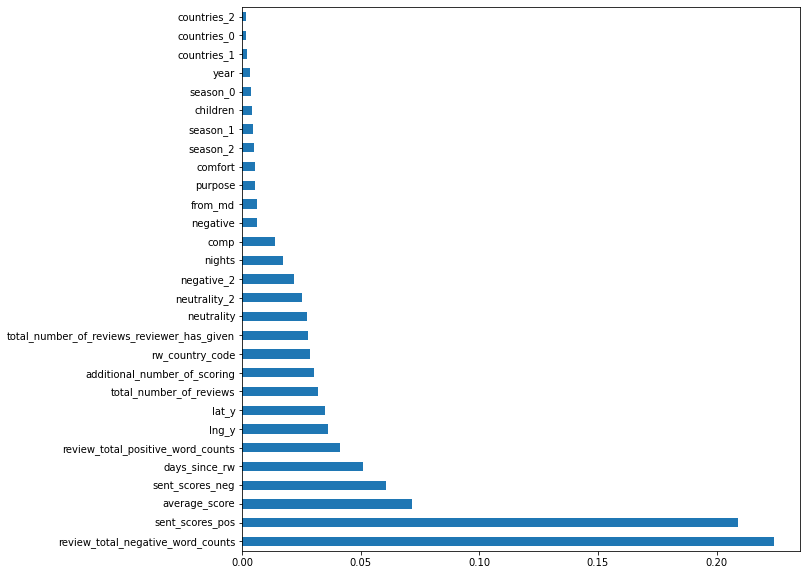

In [231]:
# в RandomForestRegressor есть возможность вывести самые важные признаки для модели
plt.rcParams['figure.figsize'] = (10,10)
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(30).plot(kind='barh')

In [232]:
test_data.sample(10)

,additional_number_of_scoring,average_score,review_total_negative_word_counts,total_number_of_reviews,review_total_positive_word_counts,total_number_of_reviews_reviewer_has_given,reviewer_score,lat_y,lng_y,nights,...,countries_1,countries_2,days_since_rw,rw_country_code,sent_scores_pos,sent_scores_neg,negative,negative_2,neutrality,neutrality_2
5493,332,8.7,3,1449,6,5,0.0,51.498147,-0.143649,2,...,0,0,265,300,0.0000,-0.2960,0.000,0.688,1.000,0.312
69075,199,8.3,19,776,12,5,0.0,51.518680,-0.135406,1,...,0,0,196,826,0.8689,-0.7902,0.000,0.381,0.357,0.619
85644,926,8.2,0,5770,12,10,0.0,52.368130,4.844085,1,...,1,0,380,372,0.5106,-0.7096,0.000,1.000,0.752,0.000
76974,198,9.4,0,1711,8,4,0.0,41.388566,2.171299,3,...,1,1,688,826,0.9022,-0.7096,0.000,1.000,0.265,0.000
4840,975,8.7,0,7656,24,1,0.0,52.354665,4.913164,3,...,1,0,289,826,0.9116,-0.7096,0.000,1.000,0.575,0.000
104835,70,8.3,102,272,7,19,0.0,51.461122,-0.275622,4,...,0,0,674,710,0.0000,0.0422,0.000,0.081,1.000,0.836
70738,221,8.2,0,3046,17,5,0.0,41.389795,2.166057,2,...,1,1,111,642,0.0000,-0.7096,0.000,1.000,1.000,0.000
21093,791,7.3,7,3609,5,2,0.0,51.515367,-0.178327,1,...,0,0,274,826,0.5859,0.0000,0.000,0.000,0.441,1.000
82252,388,8.4,3,1708,0,17,0.0,51.494775,-0.177789,2,...,0,0,493,826,0.3400,0.0000,0.379,0.000,0.000,1.000
98449,275,8.5,0,1131,10,12,0.0,51.515401,-0.057236,2,...,0,0,719,376,0.4939,-0.7096,0.000,1.000,0.714,0.000


In [233]:
test_data = test_data.drop(['reviewer_score'], axis=1)

In [234]:
sample_submission

,reviewer_score,id
0,1,488440
1,10,274649
2,3,374688
3,10,404352
4,9,451596
...,...,...
128930,7,495812
128931,1,315577
128932,3,511968
128933,6,303386


In [235]:
predict_submission = model.predict(test_data)

[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    3.2s finished


In [236]:
predict_submission

array([8.564, 7.25 , 8.784, ..., 8.408, 9.579, 7.559])

In [237]:
list(sample_submission)

['reviewer_score', 'id']

In [238]:
sample_submission['reviewer_score'] = predict_submission
sample_submission.to_csv('Asemina_submission8.csv', index=False)
sample_submission.head(10)

,reviewer_score,id
0,8.564,488440
1,7.250,274649
2,8.784,374688
3,9.771,404352
4,9.587,451596
5,9.118,302161
6,7.528,317079
7,7.346,13963
8,8.425,159785
9,7.321,195089


## Выводы:
Модель предсказания рейтинга отелей создана. Результат метрики MAPE в соревновании: 12.61272
Наиболее важные признаки, влияющие на рейтинг - признаки, отражающие эмоциональную окраску отзывов постояльцев.